In [1]:
!pip install ipywidgets

In [2]:
from google.colab import output
output.enable_custom_widget_manager()

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display

In [3]:
packages = pd.read_csv('sys_package.csv')

In [4]:
packages

,name,sys_id
0,NLU Studio,00349185770223005d7b3882a910619d
1,@servicenow/now-vis-timeseries,006683df70194c0497052ca59602580a
2,Service Catalog - Service Workspace,0097719c3b0203008ed00d8044efc478
3,Mobile Card Builder,012fa9ad7367ad6393ae5dea97af6f65
4,Rate Limit for REST API,0179696ca920211076daa554cb57d924
...,...,...
2389,Project Management Database Views,ffba6c2887d2e910efbf1f473cbb3599
2390,Subscription Based Notifications,ffe72924a920211076daa554cb57d95b
2391,@devsnc/sn-uibtk-element-context-menu,ffefe9e4a9e0211076daa554cb57d90b
2392,Gantt UI Builder Component,fff3c6cb0ccb7eba22552b8cf02aa622


In [5]:
packages = packages.append({ 'name': 'No Package', 'sys_id': '00000000000000000000000000000000' }, ignore_index=True)

<ipython-input-5-2158e18a1be8>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  packages = packages.append({ 'name': 'No Package', 'sys_id': '00000000000000000000000000000000' }, ignore_index=True)


In [6]:
metadata = pd.read_csv('sys_metadata.csv')

In [7]:
metadata

,sys_class_name,sys_package
0,sys_hub_flow_output,NaN
1,sys_documentation,NaN
2,sys_documentation,NaN
3,sys_hub_flow_input,NaN
4,sys_hub_flow_output,NaN
...,...,...
1024087,sys_hub_step_ext_output,sn_msteams_ahv2
1024088,sys_hub_step_ext_output,sn_msteams_ahv2
1024089,sys_hub_step_ext_input,sn_msteams_ahv2
1024090,sys_hub_step_ext_output,sn_msteams_ahv2


In [8]:
tables = pd.read_csv('sys_db_object.csv')

In [9]:
tables

,name,super_class,sys_package
0,ts_c_54_3,NaN,NaN
1,sys_dictionary_override,sys_metadata,NaN
2,sys_ux_macroponent_type,sys_metadata,ed08ed24a920211076daa554cb57d9c6
3,ais_configuration_attribute,NaN,dcf8a5a8a920211076daa554cb57d938
4,rate_model,NaN,9b1be0ac87d2e910efbf1f473cbb356f
...,...,...,...
9385,sc_request,task,cc6da5e8a9a0211076daa554cb57d90e
9386,sc_req_item,task,cc6da5e8a9a0211076daa554cb57d90e
9387,sc_task,task,cc6da5e8a9a0211076daa554cb57d90e
9388,sla,NaN,895c6964a9a0211076daa554cb57d99c


In [10]:
class_to_super = pd.Series(tables.super_class.values, index=tables.name).to_dict()

In [11]:
class_to_super['cmdb_ci_server']

'cmdb_ci_computer'

In [12]:
def find_base_class(class_name):
    while class_name in class_to_super and not pd.isna(class_to_super[class_name]):
        class_name = class_to_super[class_name]
    return class_name

In [13]:
find_base_class('cmdb_ci_computer')

'cmdb'

In [14]:
tables['base_class'] = tables['name'].apply(find_base_class)

In [15]:
tables

,name,super_class,sys_package,base_class
0,ts_c_54_3,NaN,NaN,ts_c_54_3
1,sys_dictionary_override,sys_metadata,NaN,sys_metadata
2,sys_ux_macroponent_type,sys_metadata,ed08ed24a920211076daa554cb57d9c6,sys_metadata
3,ais_configuration_attribute,NaN,dcf8a5a8a920211076daa554cb57d938,ais_configuration_attribute
4,rate_model,NaN,9b1be0ac87d2e910efbf1f473cbb356f,rate_model
...,...,...,...,...
9385,sc_request,task,cc6da5e8a9a0211076daa554cb57d90e,task
9386,sc_req_item,task,cc6da5e8a9a0211076daa554cb57d90e,task
9387,sc_task,task,cc6da5e8a9a0211076daa554cb57d90e,task
9388,sla,NaN,895c6964a9a0211076daa554cb57d99c,sla


In [16]:
tables_filtered = tables[tables['base_class'] == 'sys_metadata']


In [17]:
tables_filtered

,name,super_class,sys_package,base_class
1,sys_dictionary_override,sys_metadata,NaN,sys_metadata
2,sys_ux_macroponent_type,sys_metadata,ed08ed24a920211076daa554cb57d9c6,sys_metadata
6,cab_definition,mtg_definition,18351d53eb32120034d1eeea1206fe79,sys_metadata
7,catalog_ui_policy_action,sys_ui_policy_action,086da5e8a9a0211076daa554cb57d90f,sys_metadata
15,sys_ui_hp_cascading_filter,sys_metadata,703f6964a9e0211076daa554cb57d926,sys_metadata
...,...,...,...,...
9326,pa_indicators,sys_metadata,6b203d28a9e0211076daa554cb57d9a2,sys_metadata
9332,sys_kmf_certificate,sys_metadata,c515f25b53332300cd1eddeeff7b126e,sys_metadata
9354,sn_bm_client_recommendation,sys_metadata,3ad18693db92220004997878f0b8f516,sys_metadata
9358,pa_breakdowns,sys_metadata,6b203d28a9e0211076daa554cb57d9a2,sys_metadata


In [18]:
tables_filtered['sys_package'].fillna('00000000000000000000000000000000', inplace=True)

<ipython-input-18-a953801d0944>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tables_filtered['sys_package'].fillna('00000000000000000000000000000000', inplace=True)


In [19]:
packages_out = tables_filtered.groupby('sys_package')['name'].unique().reset_index()

In [20]:
packages_out

,sys_package,name
0,00000000000000000000000000000000,"[sys_dictionary_override, sys_glide_object, ts..."
1,0179696ca920211076daa554cb57d924,[sys_rate_limit_rules]
2,03292de8a920211076daa554cb57d98d,"[sys_sg_screen, sys_sg_section, sys_sg_button,..."
3,03972da0a920211076daa554cb57d992,[ecc_queue_config]
4,03d03d2ca9e0211076daa554cb57d91a,"[sys_openapi, sys_openapi_operation]"
...,...,...
447,fe5d25e8a9a0211076daa554cb57d989,"[cmn_map_marker, m2m_map_page_map_marker, m2m_..."
448,fe972da0a920211076daa554cb57d937,"[sys_rest_message, sys_auth_profile_basic, sys..."
449,ff837553a1112010db4143775de96b71,"[sn_hr_agent_tag_config, sn_hr_agent_card_config]"
450,ffe72924a920211076daa554cb57d95b,"[sys_script_email, notification_filter, cmn_no..."


In [21]:
metadata['sys_package'].fillna('00000000000000000000000000000000', inplace=True)

In [22]:
packages_in = metadata.groupby('sys_package')['sys_class_name'].unique().reset_index()

In [23]:
packages_in

,sys_package,sys_class_name
0,00000000000000000000000000000000,"[sys_hub_flow_output, sys_documentation, sys_h..."
1,00349185770223005d7b3882a910619d,"[sys_graphql_resolver_mapping, sys_graphql_res..."
2,006683df70194c0497052ca59602580a,"[sys_ux_macroponent, sys_ux_lib_asset, sys_ux_..."
3,0097719c3b0203008ed00d8044efc478,"[sp_column, sys_ui_list, m2m_sp_theme_css_incl..."
4,012fa9ad7367ad6393ae5dea97af6f65,"[sys_security_acl_role, sys_sg_view_template_s..."
...,...,...
1819,ffba6c2887d2e910efbf1f473cbb3599,"[sys_db_view, sys_db_view_table]"
1820,ffe72924a920211076daa554cb57d95b,"[sys_dictionary, sys_documentation, sys_ui_mes..."
1821,fff3c6cb0ccb7eba22552b8cf02aa622,"[sys_ux_event, sys_scope_privilege, sys_ux_lib..."
1822,global,"[sn_kmf_record_signature, x_snc_pa_demo_data_s..."


In [24]:
# Merging the dataframes on 'sys_package_sys_id' and 'sys_package_name'
df = pd.merge(packages_in, packages_out, on=['sys_package'], how='outer')
df = df.rename(columns={'sys_class_name': 'Dependencies', 'name': 'Definitions'})

In [25]:
df

,sys_package,Dependencies,Definitions
0,00000000000000000000000000000000,"[sys_hub_flow_output, sys_documentation, sys_h...","[sys_dictionary_override, sys_glide_object, ts..."
1,00349185770223005d7b3882a910619d,"[sys_graphql_resolver_mapping, sys_graphql_res...",NaN
2,006683df70194c0497052ca59602580a,"[sys_ux_macroponent, sys_ux_lib_asset, sys_ux_...",NaN
3,0097719c3b0203008ed00d8044efc478,"[sp_column, sys_ui_list, m2m_sp_theme_css_incl...",NaN
4,012fa9ad7367ad6393ae5dea97af6f65,"[sys_security_acl_role, sys_sg_view_template_s...",NaN
...,...,...,...
1819,ffba6c2887d2e910efbf1f473cbb3599,"[sys_db_view, sys_db_view_table]",NaN
1820,ffe72924a920211076daa554cb57d95b,"[sys_dictionary, sys_documentation, sys_ui_mes...","[sys_script_email, notification_filter, cmn_no..."
1821,fff3c6cb0ccb7eba22552b8cf02aa622,"[sys_ux_event, sys_scope_privilege, sys_ux_lib...",NaN
1822,global,"[sn_kmf_record_signature, x_snc_pa_demo_data_s...",[chat_survey]


In [26]:
merged_df = pd.merge(df, packages, left_on='sys_package', right_on='sys_id', how='left')
merged_df.drop('sys_id', axis=1, inplace=True)
merged_df.fillna("", inplace=True)

In [27]:
merged_df.at[0, 'Dependencies'] = ''

In [28]:
merged_df

,sys_package,Dependencies,Definitions,name
0,00000000000000000000000000000000,,"[sys_dictionary_override, sys_glide_object, ts...",No Package
1,00349185770223005d7b3882a910619d,"[sys_graphql_resolver_mapping, sys_graphql_res...",,NLU Studio
2,006683df70194c0497052ca59602580a,"[sys_ux_macroponent, sys_ux_lib_asset, sys_ux_...",,@servicenow/now-vis-timeseries
3,0097719c3b0203008ed00d8044efc478,"[sp_column, sys_ui_list, m2m_sp_theme_css_incl...",,Service Catalog - Service Workspace
4,012fa9ad7367ad6393ae5dea97af6f65,"[sys_security_acl_role, sys_sg_view_template_s...",,Mobile Card Builder
...,...,...,...,...
1819,ffba6c2887d2e910efbf1f473cbb3599,"[sys_db_view, sys_db_view_table]",,Project Management Database Views
1820,ffe72924a920211076daa554cb57d95b,"[sys_dictionary, sys_documentation, sys_ui_mes...","[sys_script_email, notification_filter, cmn_no...",Subscription Based Notifications
1821,fff3c6cb0ccb7eba22552b8cf02aa622,"[sys_ux_event, sys_scope_privilege, sys_ux_lib...",,Gantt UI Builder Component
1822,global,"[sn_kmf_record_signature, x_snc_pa_demo_data_s...",[chat_survey],Global


In [29]:
not_present = ~merged_df['sys_package'].isin(packages['sys_id'])
print(merged_df.loc[not_present, 'sys_package'])

19      03446a4f877b2d50efbf1f473cbb353c
81      0b4a6bd5977461109d9f70121153af40
88      0c648a6487d1111027bbfc48dabb3515
106     0f3b8e580b203300a1b16c2367673a75
118     1070a315977061109d9f70121153af8d
141     134450a0b3781300787162ac16a8dc1e
207     1c7b64d0c7b70010b3e4f02927c2607e
215     1ccadd4ccfd72010ffa1acc9e4cfcd7b
251     212f96f153a700100c54ddeeff7b12fb
273     23445001c3761110302e1d4ce0013156
278     23c03d2c874a2010926420eac5cb0bc6
285     24cadd4ccfd72010ffa1acc9e4cfcda1
287     2516c903c33030103622aaafc840ddfc
320     2b069e75474ec910755a77fbd36d4332
365     30d83f141b0028104a808489cc4bcb97
422     36fc6954cf132010ffa1acc9e4cfcd70
479     3da6008b87c33010f7baca69cebb3520
541     45f917bd533323007388ddeeff7b12b6
560     489f224377120010d17e20089a106164
598     4df348380f6300105f4083421a767e0b
606     4e8fdd24c7941010c24ae122c7c26013
681     5930c99185531010fa9b5a8658098e01
723     5ff97526c3032010d9c81516d840dd64
725     60cadd4ccfd72010ffa1acc9e4cfcdab
780     6870a315

In [30]:
merged_df = merged_df[merged_df['sys_package'].isin(packages['sys_id'])]
len(merged_df)


1766

In [31]:
merged_df

,sys_package,Dependencies,Definitions,name
0,00000000000000000000000000000000,,"[sys_dictionary_override, sys_glide_object, ts...",No Package
1,00349185770223005d7b3882a910619d,"[sys_graphql_resolver_mapping, sys_graphql_res...",,NLU Studio
2,006683df70194c0497052ca59602580a,"[sys_ux_macroponent, sys_ux_lib_asset, sys_ux_...",,@servicenow/now-vis-timeseries
3,0097719c3b0203008ed00d8044efc478,"[sp_column, sys_ui_list, m2m_sp_theme_css_incl...",,Service Catalog - Service Workspace
4,012fa9ad7367ad6393ae5dea97af6f65,"[sys_security_acl_role, sys_sg_view_template_s...",,Mobile Card Builder
...,...,...,...,...
1818,ffa5bd20e46db92f4f01a912f0a6ad6e,"[sys_ux_lib_component_attr, sys_ux_event, sys_...",,@servicenow/now-pagination-control
1819,ffba6c2887d2e910efbf1f473cbb3599,"[sys_db_view, sys_db_view_table]",,Project Management Database Views
1820,ffe72924a920211076daa554cb57d95b,"[sys_dictionary, sys_documentation, sys_ui_mes...","[sys_script_email, notification_filter, cmn_no...",Subscription Based Notifications
1821,fff3c6cb0ccb7eba22552b8cf02aa622,"[sys_ux_event, sys_scope_privilege, sys_ux_lib...",,Gantt UI Builder Component


In [32]:
merged_df['dependencies_count'] = df['Dependencies'].apply(lambda x: len(x) if isinstance(x, np.ndarray) else 0)
merged_df['definitions_count'] = df['Definitions'].apply(lambda x: len(x) if isinstance(x, np.ndarray) else 0)

<ipython-input-32-5c1788611eb4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['dependencies_count'] = df['Dependencies'].apply(lambda x: len(x) if isinstance(x, np.ndarray) else 0)
<ipython-input-32-5c1788611eb4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['definitions_count'] = df['Definitions'].apply(lambda x: len(x) if isinstance(x, np.ndarray) else 0)


In [33]:
import numpy as np
import plotly.express as px

# Jitter function
def jitter(values, jitter_amount):
    return values + np.random.normal(0, jitter_amount, size=len(values))

# Apply jitter to the 'definitions_count' column
jitter_amount = 0.1  # Adjust this value as needed
merged_df['definitions_count_jittered'] = jitter(merged_df['definitions_count'], jitter_amount)

# Create the scatter plot with jittered x-values
fig = px.scatter(merged_df, x='definitions_count_jittered', y='dependencies_count',
                 hover_name='name', log_x=False, size_max=60)

# Enable horizontal grid lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')

# Adjusting the layout to make the plot taller
fig.update_layout(height=2000)  # Adjust height as needed

# Show the interactive plot
fig.show()


<ipython-input-33-9ca9c73baa59>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['definitions_count_jittered'] = jitter(merged_df['definitions_count'], jitter_amount)


In [34]:
#Create a set with unique dependencies
deps = set(pd.Series([item for sublist in merged_df['Dependencies'].dropna() for item in sublist]).unique())

In [35]:
#Create a set with unique definitions
defs = set(pd.Series([item for sublist in merged_df['Definitions'].dropna() for item in sublist]).unique())

In [36]:
#How many dependencies which are never defined (should be zero)
len(deps.difference(defs))

1

In [37]:
#How many definitions which are never used
len(defs.difference(deps))

609

In [38]:
import networkx as nx

# Create the directed graph
G0 = nx.DiGraph()

# Add nodes for packages
for _, row in merged_df.iterrows():
    package_id = row['sys_package']
    package_name = row['name']
    defs = row['Definitions']
    deps = row['Dependencies']

    G0.add_node(package_id, name=package_name, defs=defs, deps=deps)

# Create a dictionary to store the features provided by each package
features_provided = {}

# Map functions to packages and populate features_provided
func_to_package = {}
for index, row in merged_df.iterrows():
    package_id = row['sys_package']
    for func in row['Definitions']:
        func_to_package[func] = package_id
        # Initialize an empty set for features provided by the package
        if package_id not in features_provided:
            features_provided[package_id] = set()

# Add edges based on dependencies and calculate intersection of 'defs' and 'deps'
for index, row in merged_df.iterrows():
    package_id = row['sys_package']
    for dep in row['Dependencies']:
        if dep in func_to_package:
            # Get the source package ID
            source_package_id = func_to_package[dep]

            # Avoid self-links
            if source_package_id != package_id:
                # Calculate the intersection of 'defs' and 'deps' between source and target nodes
                source_defs = set(G0.nodes[source_package_id]['defs'])
                target_deps = set(G0.nodes[package_id]['deps'])
                intersection = list(source_defs.intersection(target_deps))

                # Prepare additional property - list of functions
                functions_list = [intersection]  # Or any other logic to create the list of functions

                # Add an edge with the additional property
                G0.add_edge(source_package_id, package_id, functions=intersection)

# Now G has 'defs' and 'deps' properties for each package node and the intersection of 'defs' and 'deps' as an attribute for each edge (link) between source and target nodes.


In [39]:
print(len(G0.nodes))
print(len(G0.edges))

1766
14285


In [40]:
G0.nodes['00000000000000000000000000000000']

{'name': 'No Package',
 'defs': array(['sys_dictionary_override', 'sys_glide_object', 'ts_index_group',
        'sys_choice_set', 'sys_metadata', 'sys_dictionary',
        'sys_documentation', 'sys_db_object'], dtype=object),
 'deps': ''}

In [41]:
G0.nodes['419729a0a920211076daa554cb57d9f2']['deps']

array(['sys_documentation', 'sys_auto_flush', 'sys_dictionary',
       'sys_wizard_answer', 'sys_db_object', 'sys_schema_attribute',
       'sys_script_include', 'sys_app_module', 'sys_ui_section',
       'sys_job', 'ua_table_licensing_config', 'sys_script_fix',
       'sysrule_quota', 'sys_security_acl', 'sys_security_acl_role'],
      dtype=object)

In [42]:
G0.nodes['342929e8a920211076daa554cb57d9ba']

{'name': 'Subscription Management and Enforcement Framework',
 'defs': array(['ua_table_licensing_config'], dtype=object),
 'deps': array(['sys_ui_policy_action', 'sys_security_acl', 'sys_ui_related_list',
        'sysevent_register', 'sys_ui_message', 'sys_security_acl_role',
        'sys_ui_list', 'sys_ui_section', 'sys_ui_list_control',
        'sys_documentation', 'sys_choice_set', 'sys_dictionary',
        'sys_script', 'sys_ui_policy', 'sys_relationship',
        'ua_table_licensing_config', 'sys_schema_attribute',
        'sys_script_include', 'sys_script_client', 'sys_db_object',
        'sys_auto_flush'], dtype=object)}

In [43]:
G0.edges[('419729a0a920211076daa554cb57d9f2', '342929e8a920211076daa554cb57d9ba')]['functions']

['sys_auto_flush']

In [44]:
root_nodes = [node for node in G0.nodes() if G0.in_degree(node) == 0]
root_nodes

['00000000000000000000000000000000']

In [45]:
terminal_nodes = [node for node in G0.nodes() if G0.out_degree(node) == 0]
len(terminal_nodes)

1442

In [46]:
G = G0.copy()
G.remove_nodes_from(terminal_nodes)

In [47]:
nx.is_directed_acyclic_graph(G)

False

In [48]:
cycles = list(nx.simple_cycles(G))

In [49]:
len(cycles)

1217

In [50]:
bicycles = [subarray for subarray in cycles if len(subarray)  == 2 ]

In [51]:
bicycles

[['4217e120a920211076daa554cb57d9a4', '342929e8a920211076daa554cb57d9ba'],
 ['4217e120a920211076daa554cb57d9a4', '3927a520a920211076daa554cb57d9c3'],
 ['342929e8a920211076daa554cb57d9ba', '0c676960a920211076daa554cb57d969'],
 ['342929e8a920211076daa554cb57d9ba', '3927a520a920211076daa554cb57d9c3'],
 ['342929e8a920211076daa554cb57d9ba', '419729a0a920211076daa554cb57d9f2'],
 ['342929e8a920211076daa554cb57d9ba', '5157e560a920211076daa554cb57d99e'],
 ['342929e8a920211076daa554cb57d9ba', '61376d20a920211076daa554cb57d99b'],
 ['342929e8a920211076daa554cb57d9ba', 'b8176120a920211076daa554cb57d9a3'],
 ['3927a520a920211076daa554cb57d9c3', 'b8176120a920211076daa554cb57d9a3'],
 ['c1ddba4773b10010cbb654eb7df6a76b', 'cc6da5e8a9a0211076daa554cb57d90e'],
 ['fe972da0a920211076daa554cb57d937', 'c515f25b53332300cd1eddeeff7b126e'],
 ['57976da0a920211076daa554cb57d951', 'c515f25b53332300cd1eddeeff7b126e'],
 ['e4d0392ca9e0211076daa554cb57d9f5', '20d0392ca9e0211076daa554cb57d9f6'],
 ['05d57524a964211076daa5

In [52]:
translated_edges = []
for edge in bicycles:
    source, target = edge
    source_name = G.nodes[source]['name'] + ' (' + source + ')'
    target_name = G.nodes[target]['name'] + ' (' + target + ')'
    translated_edges.append((source_name, target_name))

for edge in translated_edges:
    print(f"{edge[0]} <=> {edge[1]}")

System (apps/system2) (4217e120a920211076daa554cb57d9a4) <=> Subscription Management and Enforcement Framework (342929e8a920211076daa554cb57d9ba)
System (apps/system2) (4217e120a920211076daa554cb57d9a4) <=> System (apps/system_ui) (3927a520a920211076daa554cb57d9c3)
Subscription Management and Enforcement Framework (342929e8a920211076daa554cb57d9ba) <=> UI Policy Rules (0c676960a920211076daa554cb57d969)
Subscription Management and Enforcement Framework (342929e8a920211076daa554cb57d9ba) <=> System (apps/system_ui) (3927a520a920211076daa554cb57d9c3)
Subscription Management and Enforcement Framework (342929e8a920211076daa554cb57d9ba) <=> Table Cleaner Upgrade Plugin (419729a0a920211076daa554cb57d9f2)
Subscription Management and Enforcement Framework (342929e8a920211076daa554cb57d9ba) <=> Schema for contextual security (5157e560a920211076daa554cb57d99e)
Subscription Management and Enforcement Framework (342929e8a920211076daa554cb57d9ba) <=> System (apps/system_policy) (61376d20a920211076da

In [74]:
for sub_array in bicycles:
    id1, id2 = sub_array
    name1 = G.nodes[id1]["name"]
    name2 = G.nodes[id2]["name"]

    # Access the corresponding rows in the DataFrame
    row1 = merged_df[merged_df['sys_package'] == id1]
    row2 = merged_df[merged_df['sys_package'] == id2]

    deps1 = set(row1["Dependencies"].values[0])
    deps2 = set(row2["Dependencies"].values[0])
    defs1 = set(row1["Definitions"].values[0])
    defs2 = set(row2["Definitions"].values[0])

    # Perform the operations and print results
    result2 = deps1.intersection(defs2)
    result1 = deps2.intersection(defs1)

    print(f"{name1} [{result1}] <---> {name2} [{result2}]")

System (apps/system2) [{'sys_schema_attribute'}] <---> Subscription Management and Enforcement Framework [{'ua_table_licensing_config'}]
System (apps/system2) [{'sys_properties'}] <---> System (apps/system_ui) [{'sys_ui_section', 'sys_ui_list'}]
Subscription Management and Enforcement Framework [{'ua_table_licensing_config'}] <---> UI Policy Rules [{'sys_ui_policy_action', 'sys_ui_policy'}]
Subscription Management and Enforcement Framework [{'ua_table_licensing_config'}] <---> System (apps/system_ui) [{'sys_ui_related_list', 'sys_ui_section', 'sys_ui_list_control', 'sys_relationship', 'sys_ui_list', 'sys_ui_message'}]
Subscription Management and Enforcement Framework [{'ua_table_licensing_config'}] <---> Table Cleaner Upgrade Plugin [{'sys_auto_flush'}]
Subscription Management and Enforcement Framework [{'ua_table_licensing_config'}] <---> Schema for contextual security [{'sys_security_acl', 'sys_security_acl_role'}]
Subscription Management and Enforcement Framework [{'ua_table_licensi

In [54]:
G2 = G.copy()

In [55]:
reversed_bicycles = [[sub[1], sub[0]] for sub in bicycles]

In [56]:
G2.remove_edges_from(bicycles)
G2.remove_edges_from(reversed_bicycles)

In [57]:
cycles2 = list(nx.simple_cycles(G2))
len(cycles2)

18

In [58]:
for cycle in cycles2:
    cycle_names = [G2.nodes[node_id]['name'] + " (" + node_id + ")" for node_id in cycle]
    print(' => '.join(cycle_names))

Schema for contextual security (5157e560a920211076daa554cb57d99e) => Glide Metadata Delete (cf5865a4a920211076daa554cb57d978) => System (apps/system2) (4217e120a920211076daa554cb57d9a4)
Service Portal - Core (b6de29e0a9e0211076daa554cb57d9c0) => High Availability Cloning (57976da0a920211076daa554cb57d951) => Automated Test Framework (36beada0a9e0211076daa554cb57d98d) => Predictive Intelligence (3cf8a5a8a920211076daa554cb57d9ec) => AI Search (dcf8a5a8a920211076daa554cb57d938)
Service Portal - Core (b6de29e0a9e0211076daa554cb57d9c0) => High Availability Cloning (57976da0a920211076daa554cb57d951) => Automated Test Framework (36beada0a9e0211076daa554cb57d98d) => Predictive Intelligence (3cf8a5a8a920211076daa554cb57d9ec) => AI Search (dcf8a5a8a920211076daa554cb57d938) => Service Catalog Platform (cc6da5e8a9a0211076daa554cb57d90e) => ServiceNow Key Management Framework (c515f25b53332300cd1eddeeff7b126e) => OAuth 2.0 (237829e4a920211076daa554cb57d944) => Mobile UI (5b7829e4a920211076daa554cb5

In [59]:
id_of = {}  # Create an empty dictionary to store the mapping

# Iterate through the nodes in the graph
for node_id, node_data in G0.nodes(data=True):
    if 'name' in node_data:
        # Map the node ID to its 'name' attribute
        id_of[node_data['name']] = node_id

In [60]:
id_of["ServiceNow Key Management Framework"]

'c515f25b53332300cd1eddeeff7b126e'

In [61]:
other_edges = [(id_of["Glide Metadata Delete"], id_of["System (apps/system2)"]),
               (id_of["Service Portal - Core"], id_of["High Availability Cloning"]),
               (id_of["Service Catalog Platform"],id_of["ServiceNow Key Management Framework"]),
               (id_of["Mobile UI"],id_of["ServiceNow Key Management Framework"]),
               (id_of["Service Catalog Platform"], id_of["ServiceNow Key Management Framework"]),
               (id_of["Scripted REST APIs"],id_of["ServiceNow Key Management Framework"])]

In [62]:
G2.remove_edges_from(other_edges)

In [63]:
removed_edges = bicycles + reversed_bicycles + other_edges

In [64]:
cycles2 = list(nx.simple_cycles(G2))
cycles2

[]

In [65]:
print(len(G.edges))
print(len(G2.edges))

4611
4568


In [66]:
nx.is_directed_acyclic_graph(G2)

True

In [67]:
root_nodes = [node for node, in_degree in G2.in_degree() if in_degree == 0]
root_nodes

['00000000000000000000000000000000']

In [71]:
import networkx as nx
import plotly.graph_objects as go
from ipywidgets import widgets, interact, Output, Layout

# Function to truncate text with ellipsis
def truncate_label(label, max_length):
    return label if len(label) <= max_length else label[:max_length-3] + "..."

# Create the figure
fig = go.Figure()
generations = list(nx.topological_generations(G2))

# Parameters for box size and layout
max_nodes_in_line = 8
box_height_per_line = 0.2
padding = 0.1
x_offset = 0.05
max_label_length = 40

# Initialize variable for current y position
current_y_position = 0

# Create a mapping of node IDs to trace indices
node_to_trace_index = {}

# Generate the figure
for gen, nodes in enumerate(generations):
    sorted_nodes = sorted(nodes, key=lambda n: G2.nodes[n]['name'])
    num_lines = (len(sorted_nodes) - 1) // max_nodes_in_line + 1
    box_height = num_lines * box_height_per_line

    for i, node in enumerate(sorted_nodes):
        line_number = i // max_nodes_in_line
        x_position = x_offset + (i % max_nodes_in_line) / max_nodes_in_line
        y_position = current_y_position + (line_number + 0.5) * box_height_per_line

        node_name = G2.nodes[node]['name']
        truncated_label = truncate_label(node_name, max_label_length)

        hover_text = f"Package: {node_name}"

        trace = go.Scatter(
            x=[x_position], y=[y_position],
            mode='text',
            text=[truncated_label],
            textposition="middle center",
            hovertext=[hover_text],
            hoverinfo="text",
            showlegend=False
        )
        fig.add_trace(trace)
        node_to_trace_index[node] = len(fig.data) - 1

    fig.add_shape(type="rect",
                  x0=0, y0=current_y_position, x1=1, y1=current_y_position + box_height,
                  line=dict(color="RoyalBlue"))

    fig.add_annotation(
        x=-0.01, y=current_y_position + (box_height / 2),
        text=f'Level {gen}',
        showarrow=False,
        xshift=-40,
        align='right'
    )

    current_y_position += box_height + padding

fig.update_layout(
#    title='ServiceNow Package Levels',
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False, range=[-0.1, 1]),
    yaxis=dict(showgrid=False, zeroline=False, tickvals=[], range=[0, current_y_position]),
    hovermode='closest',
    plot_bgcolor='rgba(0,0,0,0)',
    height=max(1000, current_y_position * 100),
    margin=dict(l=40, r=20, t=40, b=20)
)



# Create an Output widget for displaying the figure
output = Output()

def update_plot(selected_node):
    with output:
        output.clear_output(wait=True)  # Clear the previous output
        selected_node_id = None
        for node in G0.nodes:
            if G0.nodes[node]['name'] == selected_node:
                selected_node_id = node
                break

        for node in G2.nodes:
            trace_index = node_to_trace_index[node]
            if node == selected_node_id:
                fig.data[trace_index].textfont.color = 'orange'
                fig.data[trace_index].hovertext = '<br>'.join(G0.nodes[selected_node_id]['deps'])
            elif node in G0.predecessors(selected_node_id):
                fig.data[trace_index].textfont.color = 'red'
                fig.data[trace_index].hovertext = '<br>'.join(G0.edges[(node, selected_node_id)]['functions'])
            else:
                fig.data[trace_index].textfont.color = 'black'
                fig.data[trace_index].hovertext = ''

        fig.show()

# Create a dropdown widget with node names
node_names = [G0.nodes[node]['name'] for node in G0.nodes]
node_names = sorted(node_names)
dropdown = widgets.Dropdown(
    options=node_names,
    description='Select Node:',
    value="No Package",
    layout=Layout(display='flex', justify_content='center', width='100%')
)

# Add an interaction to update the plot based on the selected node
interact(update_plot, selected_node=dropdown)

# Set the initial width of the figure
fig.update_layout(width=3000)  # Adjust the width as needed
output

interactive(children=(Dropdown(description='Select Node:', index=1064, layout=Layout(display='flex', justify_c…

Output()

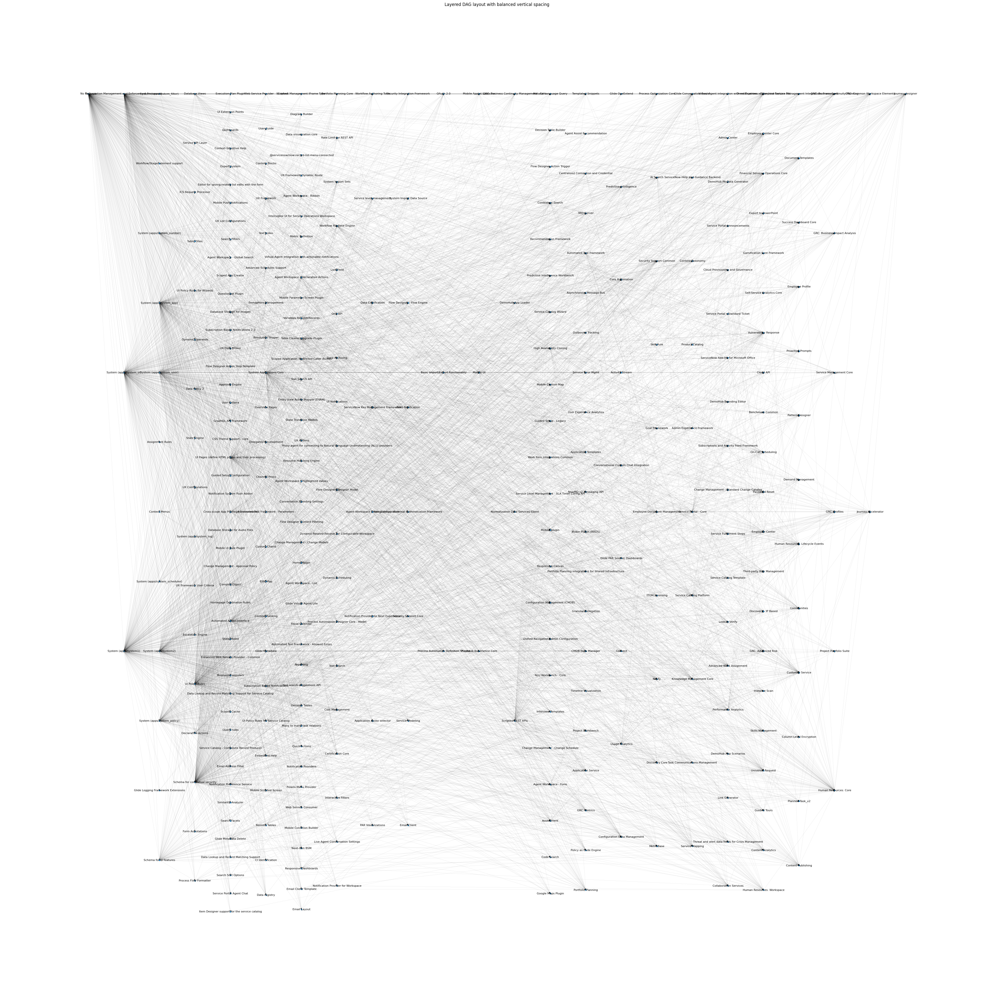

In [69]:
#This is the DAG part without terminal nodes
GRAPH = G2

generations = list(nx.topological_generations(GRAPH))

# Increase figure size
plt.figure(figsize=(40, 40))

# Parameters for layout
horizontal_spacing = 8  # Horizontal spacing between layers
vertical_space_per_layer = 100

# Create a dictionary to hold the positions with balanced vertical spacing
pos = {}
current_y = 0
for layer, gen in enumerate(generations):
    num_nodes = len(gen)
    layer_height = vertical_space_per_layer / max(num_nodes, 1)  # Avoid division by zero
    for i, node in enumerate(gen):
        pos[node] = (layer * horizontal_spacing, current_y + i * layer_height)
    current_y = 0  # Increment current_y after each layer

# Draw the graph
labels = nx.get_node_attributes(GRAPH, 'name')
nx.draw(GRAPH, pos, with_labels=True, labels=labels, node_size=10, arrowsize=5, width=0.05, font_size=8)

# Adjust plot settings and save
plt.title("Layered DAG layout with balanced vertical spacing")
plt.gca().invert_yaxis()  # Invert y-axis to have the first generation at the top
plt.savefig('dag.svg', format='svg')


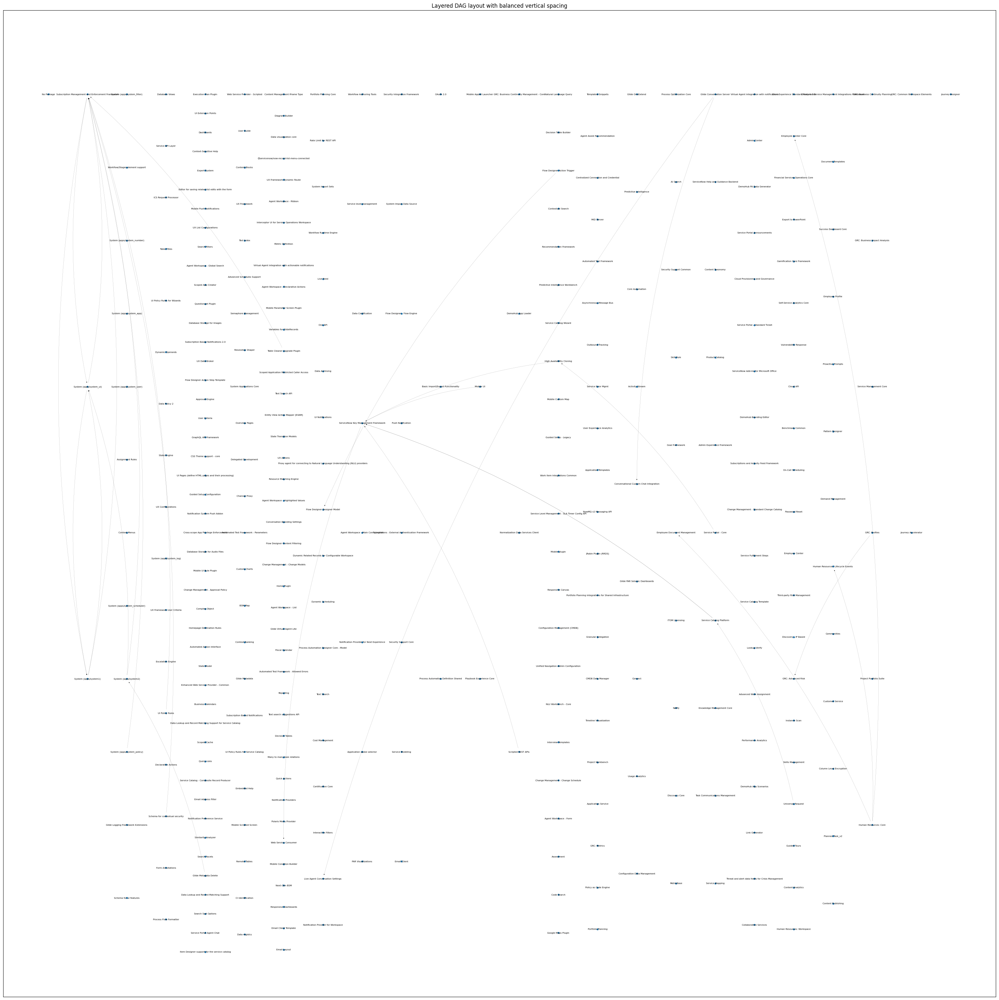

In [70]:
#This is the full graph with out of DAG edges colored
COLOR_FEEDBACK_LOOP = 'black'
COLOR_DAG = (0, 0, 0, 0)

# Calculate generations from the DAG
generations = list(nx.topological_generations(G2))
generation_map = {node: i for i, gen in enumerate(generations) for node in gen}

# Increase figure size
plt.figure(figsize=(40, 40))

# Parameters for layout
horizontal_spacing = 8  # Horizontal spacing between layers
vertical_space_per_layer = 100

# Create a dictionary to hold the positions with balanced vertical spacing
pos = {}
for layer, gen in enumerate(generations):
    num_nodes = len(gen)
    layer_height = vertical_space_per_layer / max(num_nodes, 1)
    for i, node in enumerate(gen):
        pos[node] = (layer * horizontal_spacing, i * layer_height)

# Draw nodes and labels
labels = nx.get_node_attributes(G2, 'name')
nx.draw_networkx_nodes(G2, pos, node_size=10)
nx.draw_networkx_labels(G2, pos, labels=labels, font_size=5)

# Draw edges
for edge in removed_edges:
    source_gen = generation_map.get(edge[0], -1)
    target_gen = generation_map.get(edge[1], -1)
    color = COLOR_FEEDBACK_LOOP if source_gen >= target_gen else COLOR_DAG
    nx.draw_networkx_edges(G2, pos, edgelist=[edge], edge_color=color, arrowsize=5, width=0.1, connectionstyle='arc3,rad=0.1')

# Adjust plot settings and save
plt.title("Layered DAG layout with balanced vertical spacing")
plt.gca().invert_yaxis()  # Invert y-axis to have the first generation at the top
plt.savefig('balanced_dag_with_colored_edges.svg', format='svg')
#plt.show()